In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk

In [2]:
%matplotlib inline

In [3]:
#Import data
yelp = pd.read_csv(r'C:\Users\user\Desktop\GB Data Science\Predictive Modeling\Assignment 5\yelp.csv')

In [4]:
yelp.head()

,business_id,date,review_id,stars,text,type,user_id,cool,useful,funny
0,9yKzy9PApeiPPOUJEtnvkg,2011-01-26,fWKvX83p0-ka4JS3dc6E5A,5,My wife took me here on my birthday for breakf...,review,rLtl8ZkDX5vH5nAx9C3q5Q,2,5,0
1,ZRJwVLyzEJq1VAihDhYiow,2011-07-27,IjZ33sJrzXqU-0X6U8NwyA,5,I have no idea why some people give bad review...,review,0a2KyEL0d3Yb1V6aivbIuQ,0,0,0
2,6oRAC4uyJCsJl1X0WZpVSA,2012-06-14,IESLBzqUCLdSzSqm0eCSxQ,4,love the gyro plate. Rice is so good and I als...,review,0hT2KtfLiobPvh6cDC8JQg,0,1,0
3,_1QQZuf4zZOyFCvXc0o6Vg,2010-05-27,G-WvGaISbqqaMHlNnByodA,5,"Rosie, Dakota, and I LOVE Chaparral Dog Park!!...",review,uZetl9T0NcROGOyFfughhg,1,2,0
4,6ozycU1RpktNG2-1BroVtw,2012-01-05,1uJFq2r5QfJG_6ExMRCaGw,5,General Manager Scott Petello is a good egg!!!...,review,vYmM4KTsC8ZfQBg-j5MWkw,0,0,0


In [5]:
#Checking data types
yelp.dtypes

business_id    object
date           object
review_id      object
stars           int64
text           object
type           object
user_id        object
cool            int64
useful          int64
funny           int64
dtype: object

In [7]:
yelp['cool'].sample(10)

8732    0
8068    0
543     0
6051    0
2821    0
1549    4
9977    3
8306    0
662     1
4353    0
Name: cool, dtype: int64

[Text(0, 0.5, 'Count'),
 Text(0.5, 0, 'Cool'),
 Text(0.5, 1.0, 'Cool Voting Counts')]

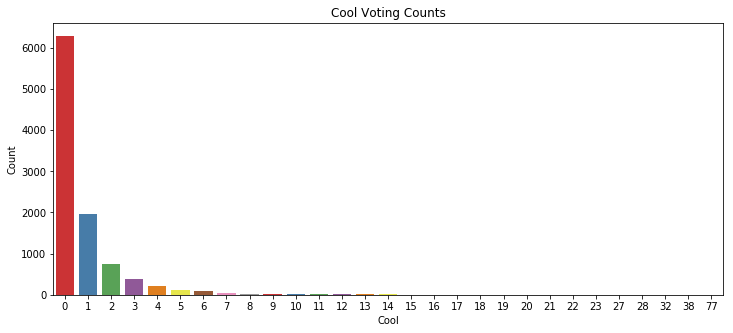

In [131]:
#Showing the count of Cool columns
plt.figure(figsize=(12,5))
ax=sns.countplot(x="cool",data=yelp,color='green',palette='Set1')
ax.set(xlabel='Cool', ylabel='Count',title='Cool Voting Counts')

[Text(0, 0.5, 'Count'),
 Text(0.5, 0, 'Useful'),
 Text(0.5, 1.0, 'Useful Voting Counts')]

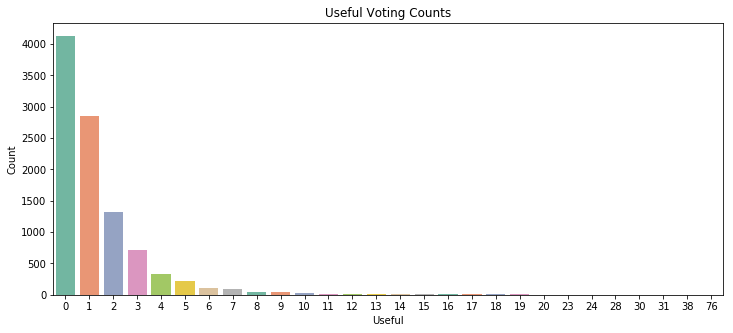

In [132]:
#Showing the count of Useful columns
plt.figure(figsize=(12,5))
ax=sns.countplot(x="useful",data=yelp,color='green',palette='Set2')
ax.set(xlabel='Useful', ylabel='Count',title='Useful Voting Counts')

[Text(0, 0.5, 'Count'),
 Text(0.5, 0, 'Funny'),
 Text(0.5, 1.0, 'Funny Voting Counts')]

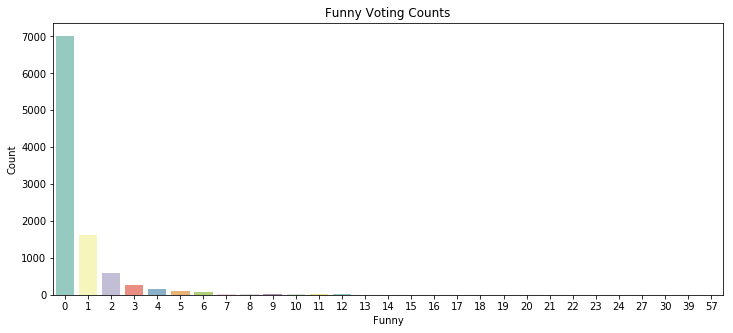

In [133]:
#Showing the count of Funny columns
plt.figure(figsize=(12,5))
ax=sns.countplot(x="funny",data=yelp,color='green',palette='Set3')
ax.set(xlabel='Funny', ylabel='Count',title='Funny Voting Counts')

C:\Users\user\Anaconda3\lib\site-packages\matplotlib\figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


<Figure size 864x360 with 0 Axes>

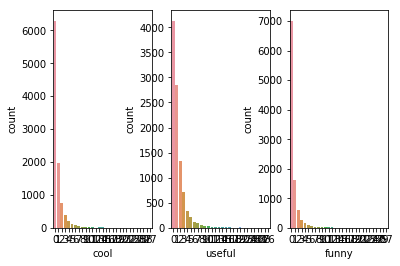

In [33]:
#plt.figure(figsize=(12,5))
#fig, ax =plt.subplots(1,3)
#sns.countplot(x='cool', data=yelp, ax=ax[0])
#sns.countplot(x='useful', data=yelp ,ax=ax[1])
#sns.countplot(x='funny', data=yelp ,ax=ax[2])
#fig.show()

In [117]:
#Filter out stars greater than 0
yelp2 = yelp.loc[yelp['stars']>0]

In [118]:
#Create a new dataframe with text and stars
data = yelp2[['text','stars']]

In [119]:
#Checking data types
data.dtypes

text     object
stars     int64
dtype: object

In [120]:
#Tokenization - Convert string into lower cases
data['text 2']=data['text'].str.lower()

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [121]:
#Tokenization - Remove punctuation
import re 
data['text 2']=data['text 2'].apply(lambda x: re.sub(r'[^\w\s]','', str(x)))

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [122]:
#Import nltk stopwords package
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [123]:
#Tokenization - Create final column by removing stopwords
data['final text'] = data['text 2'].apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [125]:
#Create data for train set and test set
x=data['final text']
y=data['stars']

In [126]:
# Transform feature matrix into sparse matrix using TFIDF Vectorizer

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
x_transformed = vectorizer.fit_transform(x)
x_transformed

<10000x36255 sparse matrix of type '<class 'numpy.float64'>'
	with 570453 stored elements in Compressed Sparse Row format>

In [127]:
#Split the data to train and test set
from sklearn.model_selection import train_test_split

xtrain, xtest, ytrain, ytest = train_test_split(x_transformed, y,
                                                test_size = 0.33,
                                                random_state = 42)

In [128]:
#Fit classifier on train set
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()
model.fit(xtrain,ytrain)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [129]:
#Predict labels using the MultinomicalNB model
y_pred = model.predict(xtest)

In [130]:
#Generate accuracy score
from sklearn.metrics import accuracy_score 
accuracy = accuracy_score(y_pred,ytest)
accuracy

0.4290909090909091

In [13]:
#nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [10]:
data['text']

0       My wife took me here on my birthday for breakf...
1       I have no idea why some people give bad review...
2       love the gyro plate. Rice is so good and I als...
3       Rosie, Dakota, and I LOVE Chaparral Dog Park!!...
4       General Manager Scott Petello is a good egg!!!...
5       Quiessence is, simply put, beautiful.  Full wi...
6       Drop what you're doing and drive here. After I...
7       Luckily, I didn't have to travel far to make m...
8       Definitely come for Happy hour! Prices are ama...
9       Nobuo shows his unique talents with everything...
10      The oldish man who owns the store is as sweet ...
11      Wonderful Vietnamese sandwich shoppe. Their ba...
12      They have a limited time thing going on right ...
13      Good tattoo shop. Clean space, multiple artist...
14      I'm 2 weeks new to Phoenix. I looked up Irish ...
15      Was it worth the 21$ for a salad and small piz...
16      We went here on a Saturday afternoon and this ...
17      okay t

In [16]:
#import string
#txt = " ".join(data['text']) # make a string of all the strings joing by space.
#txt = txt.lower() # convert all words to lower case letter

In [11]:
txt

NameError: name 'txt' is not defined

In [18]:
#Removing punctuation and special characters
#import re
#pattern = '[^\w\s]'
#txt2 = re.sub(pattern,'', txt)
#print(txt2)

In [45]:
# text.split() works in the simplest cases for Tokenisation, but would give you problems in cases such as Mr. John

words = nltk.word_tokenize(txt2)
sentences = nltk.sent_tokenize(txt2)


print(words)
print()
print(sentences)

['my', 'wife', 'took', 'me', 'here', 'on', 'my', 'birthday', 'for', 'breakfast', 'and', 'it', 'was', 'excellent', 'the', 'weather', 'was', 'perfect', 'which', 'made', 'sitting', 'outside', 'overlooking', 'their', 'grounds', 'an', 'absolute', 'pleasure', 'our', 'waitress', 'was', 'excellent', 'and', 'our', 'food', 'arrived', 'quickly', 'on', 'the', 'semibusy', 'saturday', 'morning', 'it', 'looked', 'like', 'the', 'place', 'fills', 'up', 'pretty', 'quickly', 'so', 'the', 'earlier', 'you', 'get', 'here', 'the', 'better', 'do', 'yourself', 'a', 'favor', 'and', 'get', 'their', 'bloody', 'mary', 'it', 'was', 'phenomenal', 'and', 'simply', 'the', 'best', 'ive', 'ever', 'had', 'im', 'pretty', 'sure', 'they', 'only', 'use', 'ingredients', 'from', 'their', 'garden', 'and', 'blend', 'them', 'fresh', 'when', 'you', 'order', 'it', 'it', 'was', 'amazing', 'while', 'everything', 'on', 'the', 'menu', 'looks', 'excellent', 'i', 'had', 'the', 'white', 'truffle', 'scrambled', 'eggs', 'vegetable', 'skille

In [12]:
#Removing stop words
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = nltk.corpus.stopwords.words('english')
filtered_words = [i for i in words if not i in stop_words]

print(stop_words)
print()
print(filtered_words)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


NameError: name 'words' is not defined

In [20]:
X=data['text']
Y=data['stars']

In [21]:
#word_list=[]

#i=0

# Iterating through each text
#for test in data['text']:
    
    # splits txt into words, drop any non-alphabet characters
     #w_list = re.sub(r'[^\w\s]',' ', test.lower()).split() 
    
    # add another columns with tokens of that text as features
     #data.loc[i, 'text1'] = ' '.join(w_list) 
        
    # Remove stopwords from w_list
     #w_list = [w for w in w_list if w not in stopwords.words('english')] 
    
    # List of all the tokens without stopwords
     #word_list += w_list 
    
    # Incrementing the index variable
     #i += 1

#data.head()

In [22]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#vectorizer = TfidfVectorizer()
#X_transformed = vectorizer.fit_transform(X)
#X_transformed

In [24]:
#tokenizer = nltk.RegexpTokenizer(r"\w+")

In [23]:

#new_words = tokenizer.tokenize(txt)

In [25]:
#testing
data['text']

0       My wife took me here on my birthday for breakf...
1       I have no idea why some people give bad review...
2       love the gyro plate. Rice is so good and I als...
3       Rosie, Dakota, and I LOVE Chaparral Dog Park!!...
4       General Manager Scott Petello is a good egg!!!...
5       Quiessence is, simply put, beautiful.  Full wi...
6       Drop what you're doing and drive here. After I...
7       Luckily, I didn't have to travel far to make m...
8       Definitely come for Happy hour! Prices are ama...
9       Nobuo shows his unique talents with everything...
10      The oldish man who owns the store is as sweet ...
11      Wonderful Vietnamese sandwich shoppe. Their ba...
12      They have a limited time thing going on right ...
13      Good tattoo shop. Clean space, multiple artist...
14      I'm 2 weeks new to Phoenix. I looked up Irish ...
15      Was it worth the 21$ for a salad and small piz...
16      We went here on a Saturday afternoon and this ...
17      okay t

In [13]:
#Remove punctuation
import re 
data['text 2 test']=data['text'].apply(lambda x: re.sub(r'[^\w\s]','', str(x)))

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [14]:
#Convert string into lower cases
data['text 2 test']=data['text 2 test'].str.lower()

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [15]:
data['text 2 test']

0       my wife took me here on my birthday for breakf...
1       i have no idea why some people give bad review...
2       love the gyro plate rice is so good and i also...
3       rosie dakota and i love chaparral dog park its...
4       general manager scott petello is a good egg no...
5       quiessence is simply put beautiful  full windo...
6       drop what youre doing and drive here after i a...
7       luckily i didnt have to travel far to make my ...
8       definitely come for happy hour prices are amaz...
9       nobuo shows his unique talents with everything...
10      the oldish man who owns the store is as sweet ...
11      wonderful vietnamese sandwich shoppe their bag...
12      they have a limited time thing going on right ...
13      good tattoo shop clean space multiple artists ...
14      im 2 weeks new to phoenix i looked up irish ba...
15      was it worth the 21 for a salad and small pizz...
16      we went here on a saturday afternoon and this ...
17      okay t

In [16]:
#Create final column by removing stopwords
data['final text'] = data['text 2 test'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords.words('english'))]))

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [17]:
data['final text'].tail(5)

9995    first visithad lunch today used groupon ordere...
9996    called house deliciousness could go item item ...
9997    recently visited olive ivy business last week ...
9998    nephew moved scottsdale recently bunch friends...
9999    45 locations 45 star average think arizona rea...
Name: final text, dtype: object

In [33]:
data.head(5)

,text,stars,text 2 test,final text
0,My wife took me here on my birthday for breakf...,5,my wife took me here on my birthday for breakf...,wife took birthday breakfast excellent weather...
1,I have no idea why some people give bad review...,5,i have no idea why some people give bad review...,idea people give bad reviews place goes show p...
2,love the gyro plate. Rice is so good and I als...,4,love the gyro plate rice is so good and i also...,love gyro plate rice good also dig candy selec...
3,"Rosie, Dakota, and I LOVE Chaparral Dog Park!!...",5,rosie dakota and i love chaparral dog park its...,rosie dakota love chaparral dog park convenien...
4,General Manager Scott Petello is a good egg!!!...,5,general manager scott petello is a good egg no...,general manager scott petello good egg go deta...


In [47]:
#Create a final dataset
testing = final_data.to_dict('records')

In [48]:
testing

[{'final text': 'wife took birthday breakfast excellent weather perfect made sitting outside overlooking grounds absolute pleasure waitress excellent food arrived quickly semibusy saturday morning looked like place fills pretty quickly earlier get better favor get bloody mary phenomenal simply best ive ever im pretty sure use ingredients garden blend fresh order amazing everything menu looks excellent white truffle scrambled eggs vegetable skillet tasty delicious came 2 pieces griddled bread amazing absolutely made meal complete best toast ive ever anyway cant wait go back',
  'stars': 5},
 {'final text': 'idea people give bad reviews place goes show please everyone probably griping something faultthere many people like case friend arrived 550 pm past sunday pretty crowded thought sunday evening thought would wait forever get seat said well seated girl comes back seating someone else seated 552 waiter came got drink orders everyone pleasant host seated us waiter server prices good well

In [18]:
data.dtypes


text           object
stars           int64
text 2 test    object
final text     object
dtype: object

In [19]:
X=data['final text']
Y=data['stars']

In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X_transformed = vectorizer.fit_transform(X)
X_transformed

<10000x36255 sparse matrix of type '<class 'numpy.float64'>'
	with 570453 stored elements in Compressed Sparse Row format>

In [21]:
from sklearn.model_selection import train_test_split

Xtrain, Xtest, ytrain, ytest = train_test_split(X_transformed, Y,
                                                test_size = 0.20,
                                                random_state = 0)

In [22]:
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()

In [24]:
model.fit(Xtrain,ytrain)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [25]:
y_prediction = model.predict(Xtest)

In [26]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_prediction, ytest)
accuracy

0.418

In [27]:
from sklearn.metrics import confusion_matrix

In [28]:
confusion_matrix(y_prediction, ytest)

array([[  0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0],
       [126, 169, 271, 624, 480],
       [ 24,   9,  13,  72, 212]], dtype=int64)